In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env genesys on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
#dataset = Root_Dataset(data['X_test'], data['y_test'])
#loader = DataLoader(dataset,
#                         batch_size = batch_size,
#                         shuffle = True, drop_last=True)

X_all = np.vstack((data['X_train'],data['X_val'],data['X_test']))
y_all = pd.concat((data['y_train'],data['y_val'],data['y_test']))
dataset = Root_Dataset(X_all, y_all)
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [6]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

## Extract a sample

In [7]:
sample = next(iter(loader))
xo = sample['x'].to(device)
y = sample['y'].to(device)
y_label = [num2class[i] for i in y.tolist()]

In [8]:
xo.shape

torch.Size([2000, 11, 17513])

In [9]:
len(y_label)

2000

In [10]:
len(loader)

55

In [11]:
## GRN for the transition t7 to t9
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            #pred_h = model.init_hidden(batch_size)
            #tfrom = model.generate_current(x, pred_h, 0).to('cpu').detach().numpy()
            #cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            cfrom = x[np.where(np.array(y_label)==ct)[0],7,:] 
            
            #pred_h = model.init_hidden(batch_size)
            #tto = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()   
            #cto = tto[np.where(np.array(y_label)==ct)[0],:]
            cto = x[np.where(np.array(y_label)==ct)[0],9,:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast


/tmp/ipykernel_984347/1398938877.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()


Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [12]:
# Save the array to disk
np.save('genesys_raw_ctw_t7-t9.npy', ctw)

In [11]:
ctw = np.load('genesys_raw_ctw_t7-t9.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    if np.std(ctw[i])==0:
        ctw_z[i] = np.zeros((17513, 17513))
    else:
        ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network Analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [19]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

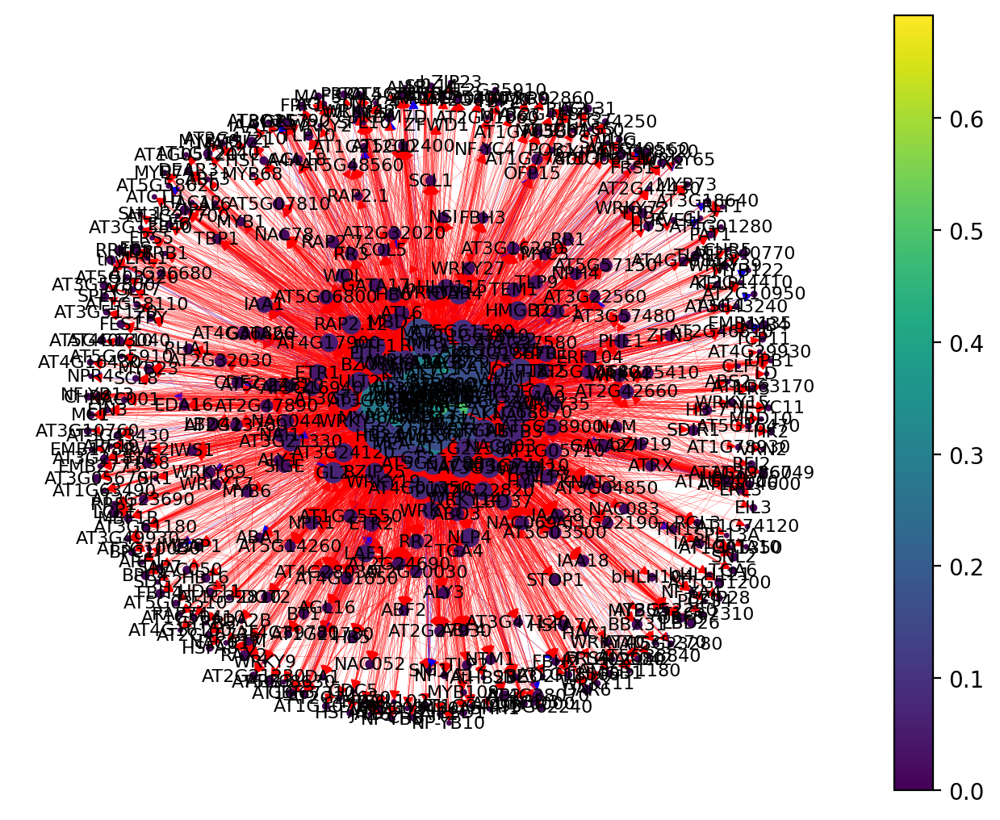

In [20]:
atri = network(0)

In [21]:
atri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
TGA10,1.077088,0.595289,0.481799,0.967931,0.000342,0.182885
IAA1,0.126338,0.040685,0.085653,0.955253,0.000240,0.059468
PHE1,0.057816,0.029979,0.027837,0.954554,0.000180,0.029390
LBD25,0.391863,0.261242,0.130621,0.953971,0.000252,0.109889
AT3G21330,0.094218,0.059957,0.034261,0.953824,0.000202,0.041413
...,...,...,...,...,...,...
JMJ18,0.008565,0.004283,0.004283,0.000000,0.000178,0.008915
AT1G62310,0.008565,0.004283,0.004283,0.000000,0.000149,0.005849
AT5G07810,0.025696,0.019272,0.006424,0.000000,0.000162,0.016625
FBH3,0.064240,0.017131,0.047109,0.000000,0.000229,0.039612


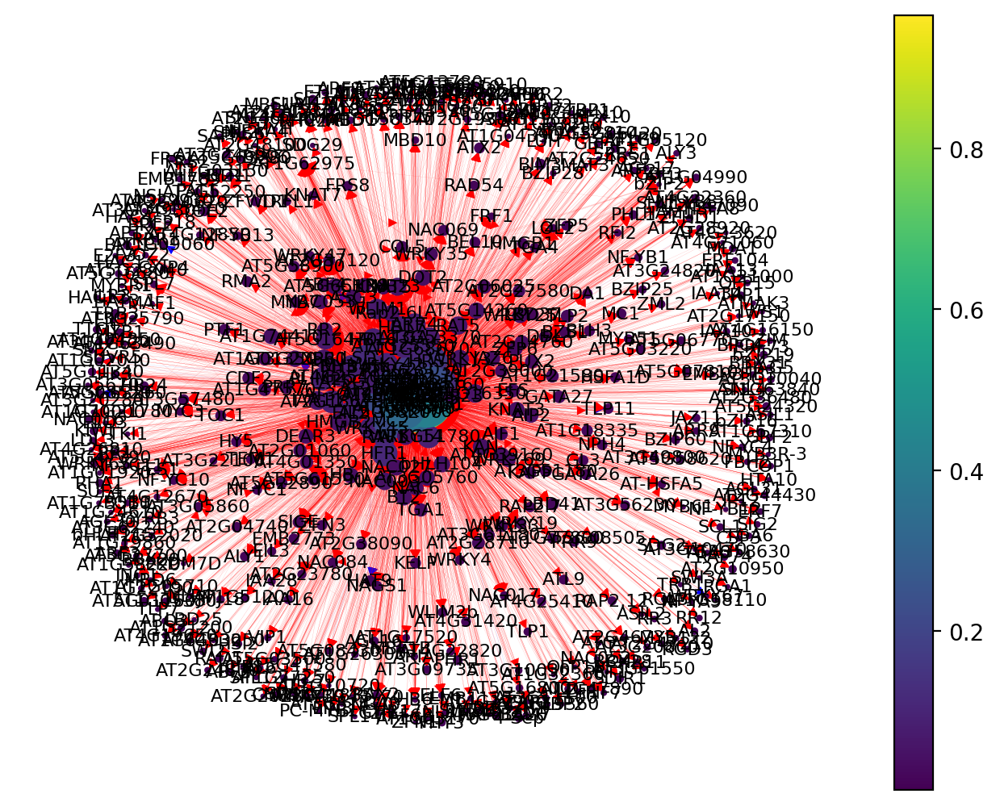

In [22]:
tri = network(1)

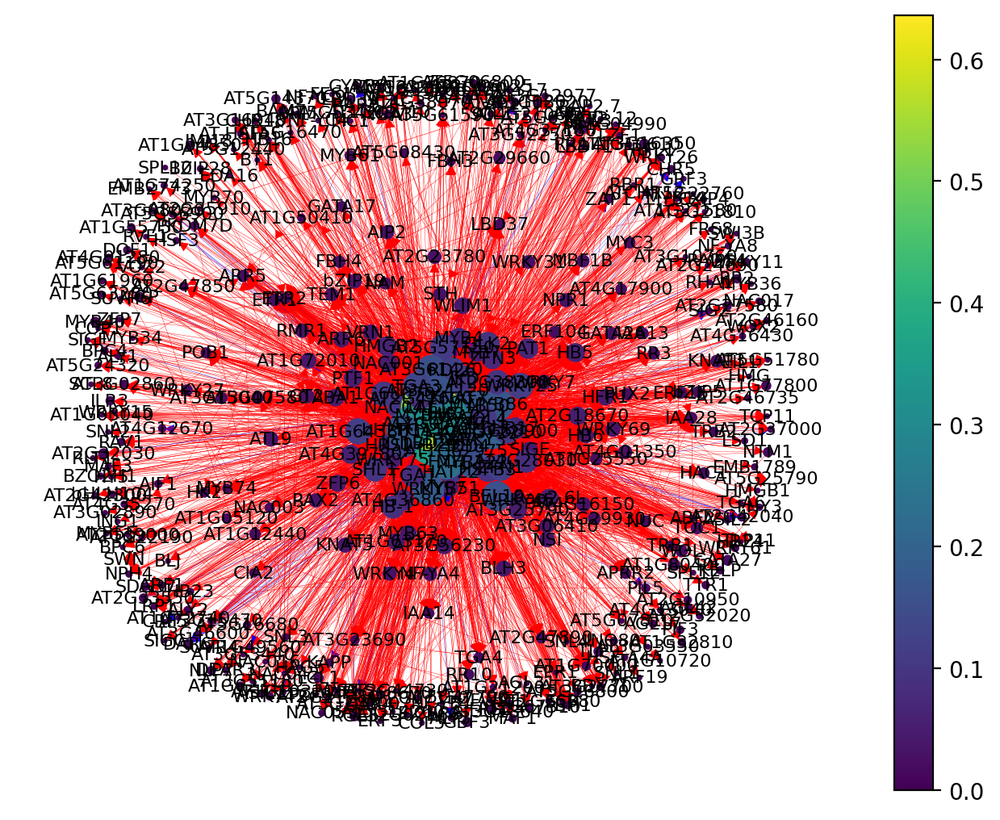

In [23]:
cor = network(2)

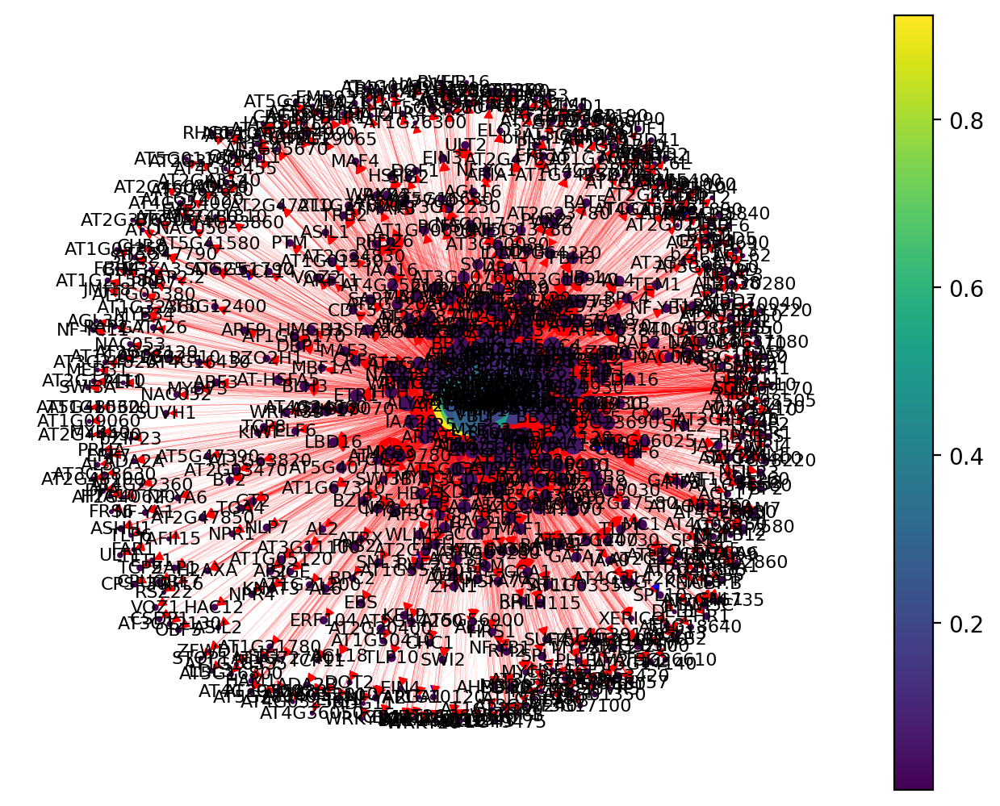

In [24]:
end = network(3)

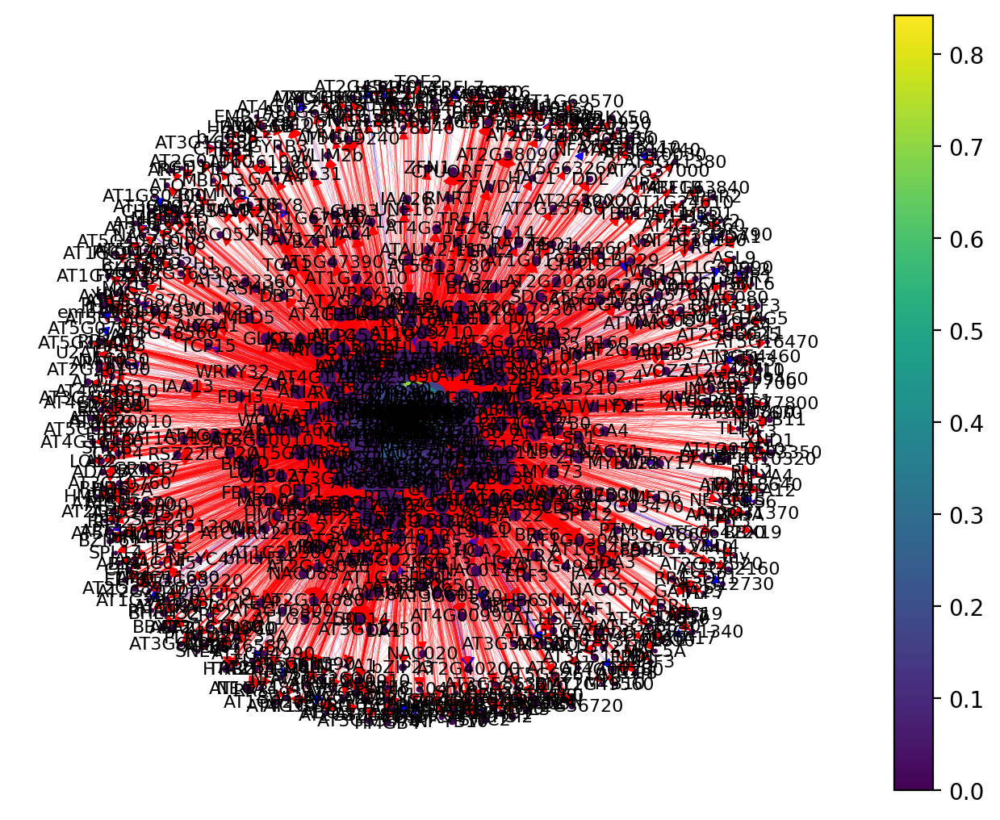

In [25]:
per = network(4)

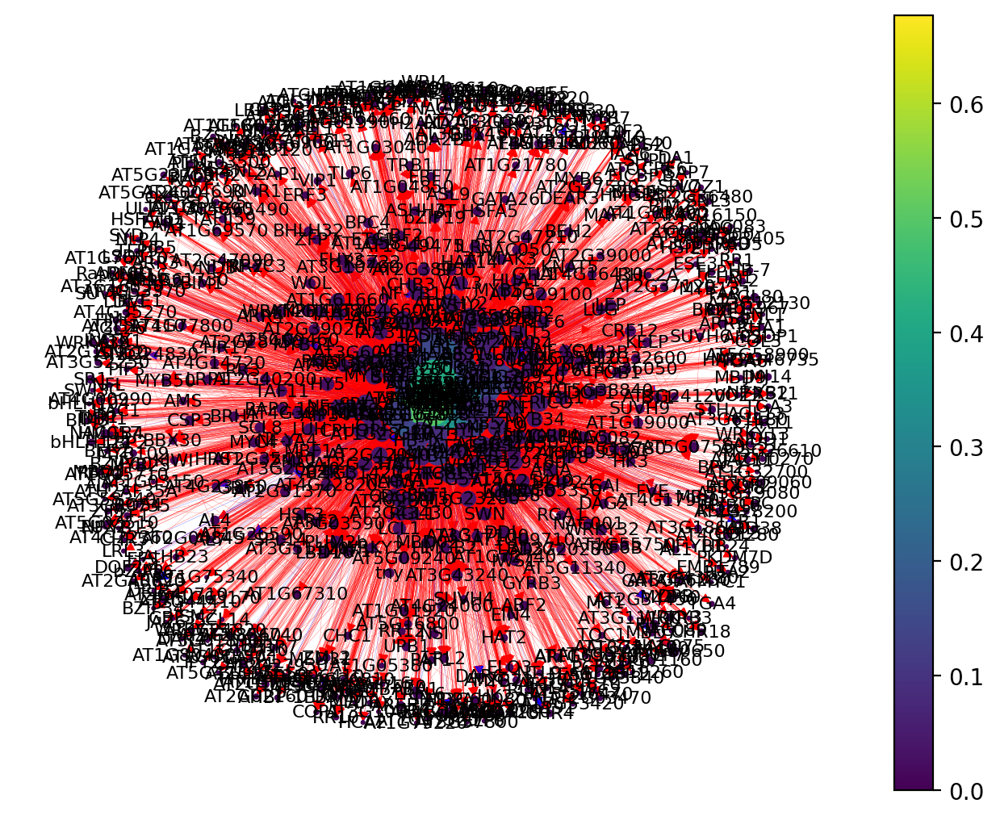

In [26]:
pro = network(5)

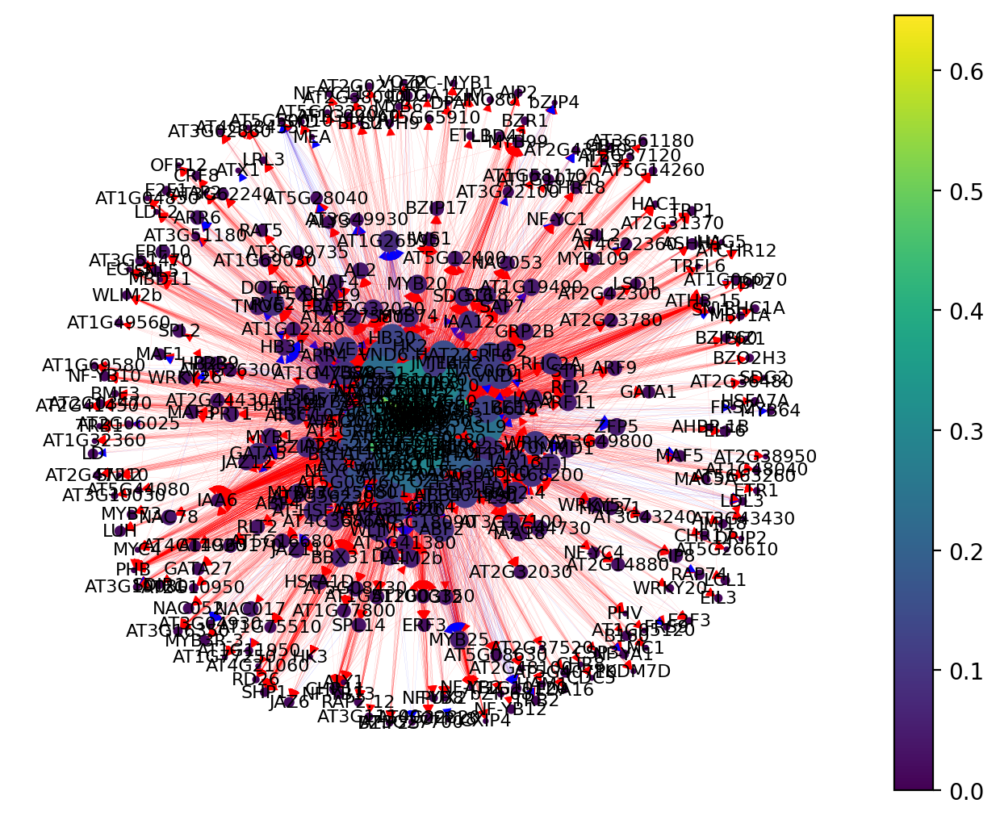

In [27]:
xyl = network(6)

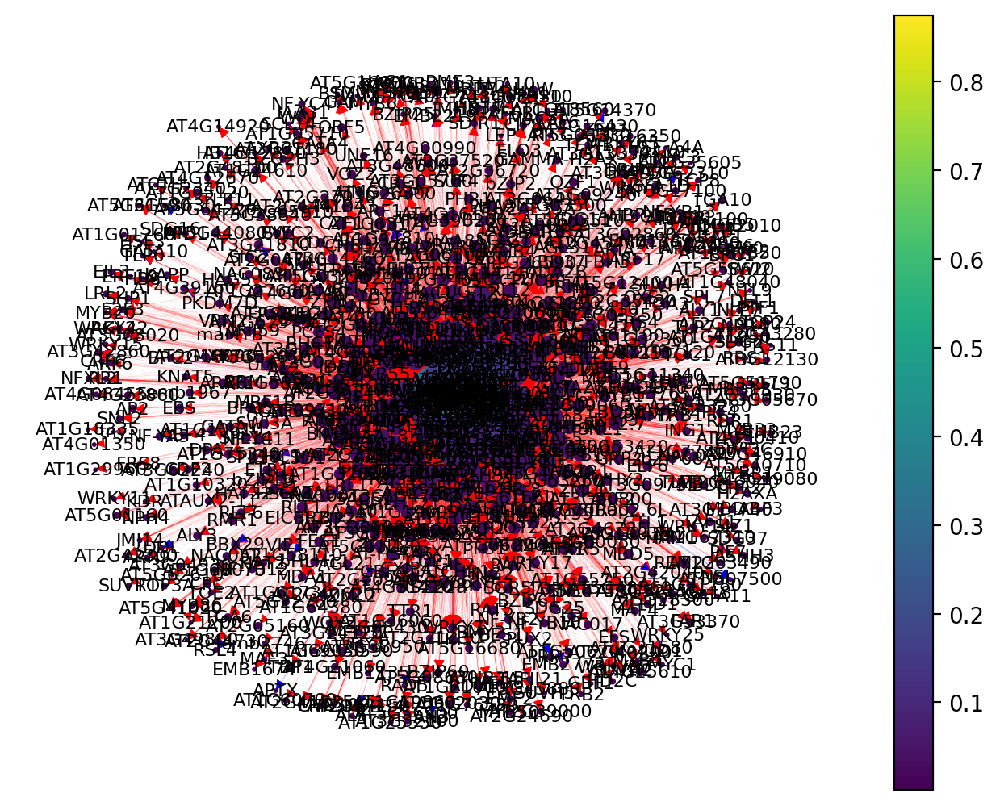

In [28]:
phl = network(7)

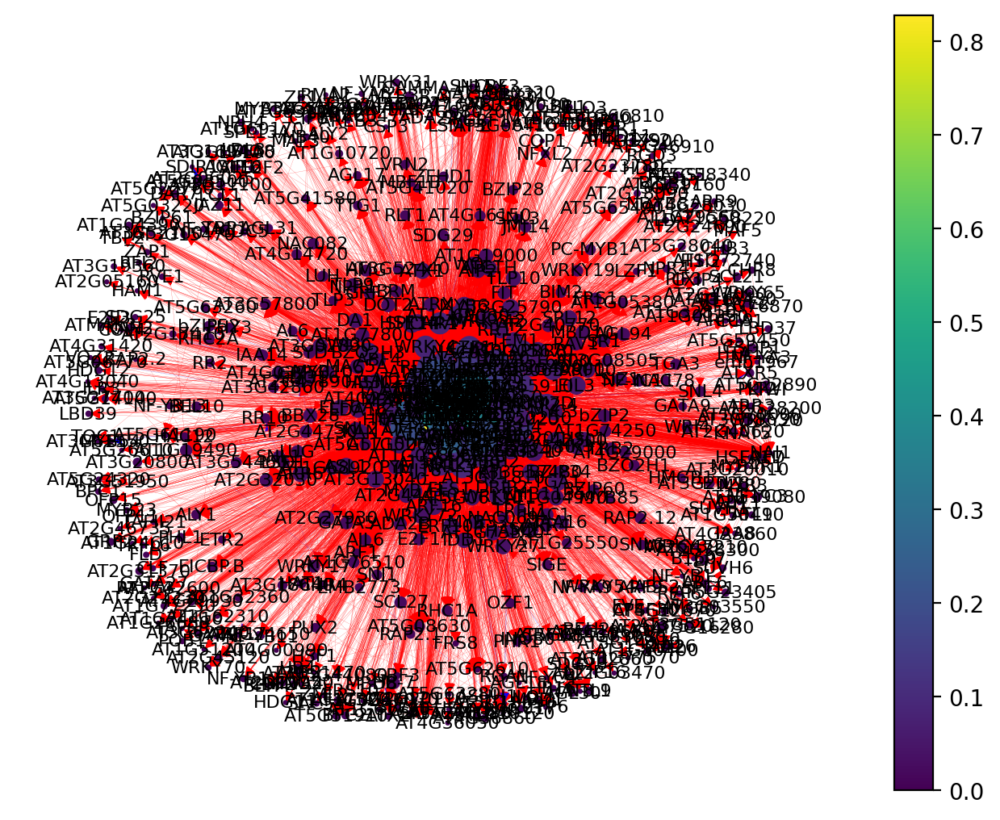

In [29]:
lrc = network(8)

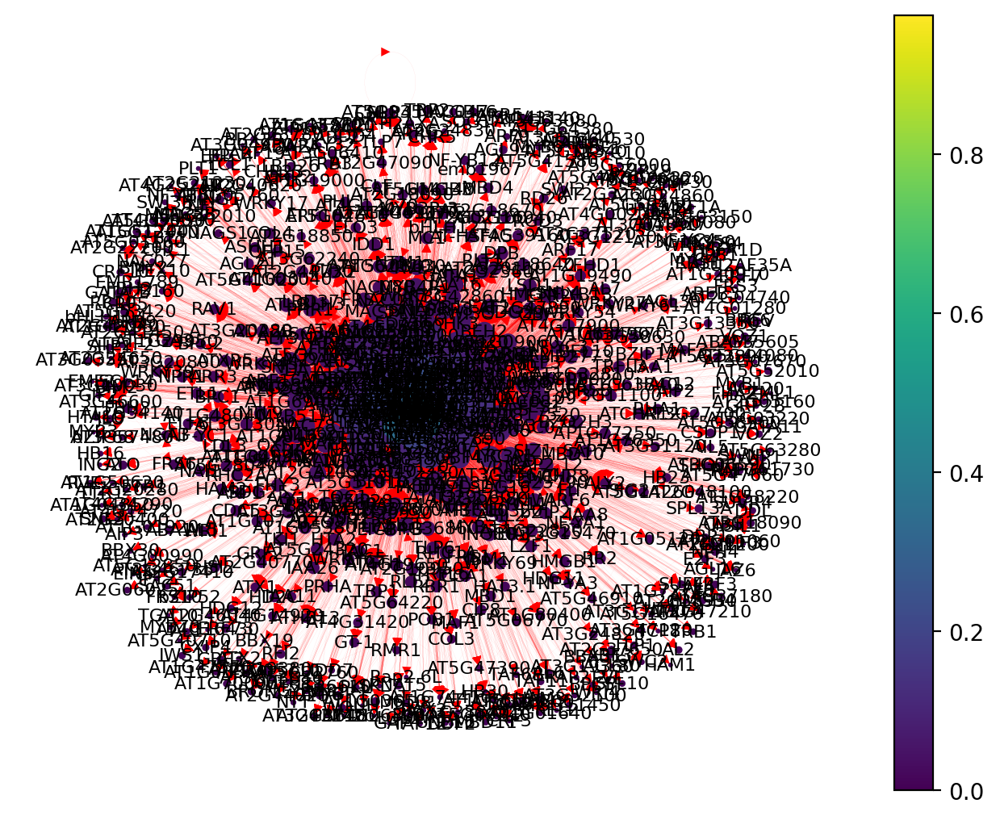

In [30]:
col = network(9)

In [31]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [32]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [33]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum


In [34]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
LRL3,0.000005,0.319964,0.006424,0.965909,0.004283,0.920455,6,8.217039
AT3G05860,0.779462,0.007809,0.284797,0.009470,0.331906,0.049242,6,7.462685
AT5G06800,0.004949,0.552962,0.029979,0.331439,0.072805,0.134470,6,7.126604
Rap2.6L,0.128820,0.000783,0.171306,0.041667,0.306210,0.160985,6,6.809771
MC2,0.091562,0.009958,0.149893,0.217803,0.092077,0.123106,6,6.684400
HB24,0.226406,0.001362,0.137045,0.009470,0.149893,0.013258,6,6.537434
HFR1,0.000482,0.011788,0.044968,0.109848,0.132762,0.030303,6,6.330152
NAC003,0.002063,0.000173,0.092077,0.047348,0.074946,0.062500,6,6.279108


In [35]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
PHE1,0.954554,0.029979,0.027837,3,4.012370
AT3G21330,0.953824,0.059957,0.034261,3,4.048042
WRKY13,0.947124,0.102784,0.128480,3,4.178387
AT2G28710,0.942382,0.353319,0.269807,3,4.565508
MEA,0.453713,0.130621,0.132762,3,3.717097
AT4G38070,0.294368,0.017131,0.006424,3,3.317923
GATA17,0.212529,0.029979,0.008565,3,3.251073
GL2,0.105398,0.072805,0.164882,3,3.343086
AT4G31650,0.098418,0.021413,0.023555,3,3.143386
AT5G26749,0.049682,0.010707,0.017131,3,3.077520


In [36]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
RAP2.11,0.899341,0.214015,0.034091,3,4.147447
EIL2,0.898780,0.096591,0.022727,3,4.018098
AT5G56200,0.892592,0.225379,0.073864,3,4.191834
RSL2,0.892301,0.740530,0.242424,3,4.875255
RSL4,0.877641,0.412879,0.111742,3,4.402263
4-Sep,0.841628,0.009470,0.005682,3,3.856779
HAT9,0.567244,0.015152,0.005682,3,3.588077
RHD6,0.545361,0.494318,0.340909,3,4.380588
AT1G02040,0.530274,0.005682,0.005682,3,3.541638
AT2G20030,0.475073,0.215909,0.034091,3,3.725073


In [37]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
OFP6,0.843085,0.199659,0.116041,3,4.158785
bZIP52,0.795344,0.015358,0.010239,3,3.820942
AT3G46070,0.312657,0.003413,0.011945,3,3.328016
AGL17,0.147230,0.008532,0.046075,3,3.201838
BNQ3,0.033138,0.061433,0.029010,3,3.123582
REF6,0.030606,0.003413,0.023891,3,3.057910
AT4G14720,0.013731,0.013652,0.023891,3,3.051273
HMGB5,0.007754,0.001706,0.040956,3,3.050416
BZIP34,0.003378,0.027304,0.035836,3,3.066518
HB4,0.002879,0.008532,0.032423,3,3.043835


In [38]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
SUVH6,0.245093,0.018519,0.107143,3,3.370754
SMZ,0.064750,0.042328,0.063492,3,3.170570
MYB4R1,0.038030,0.047619,0.062169,3,3.147819
NAM,0.030315,0.455026,0.212963,3,3.698304
AT1G77570,0.016572,0.018519,0.091270,3,3.126360
...,...,...,...,...,...
bHLH11,0.000005,0.002646,0.015873,3,3.018524
AIL5,0.000004,0.006614,0.006614,3,3.013231
MBD10,0.000004,0.023810,0.047619,3,3.071432
SPL13A,0.000002,0.007937,0.001323,3,3.009261


In [39]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
MYB122,0.069754,0.735343,0.165394,0.285307,0.058524,0.206847,6,7.521170
IDD4,0.003375,0.049073,0.147583,0.057061,0.106870,0.042796,6,6.406758
JKD,0.005057,0.000919,0.104326,0.084165,0.078880,0.102710,6,6.376058
ABA1,0.007205,0.000004,0.045802,0.019971,0.043257,0.048502,6,6.164741


In [40]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
IDD7,0.782923,0.129771,0.053435,3,3.966129
AT3G51120,0.390877,0.010178,0.002545,3,3.403600
AT1G72210,0.296055,0.198473,0.315522,3,3.810050
CRF5,0.156969,0.002545,0.002545,3,3.162058
AT2G37000,0.041414,0.005089,0.017812,3,3.064314
AT2G38300,0.040855,0.096692,0.259542,3,3.397089
RGL3,0.040011,0.012723,0.137405,3,3.190139
COL4,0.005881,0.109415,0.099237,3,3.214532
PIL5,0.005134,0.010178,0.002545,3,3.017857
MYB14,0.002519,0.005089,0.068702,3,3.076310


In [41]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
chr31,0.974708,0.512126,0.228245,3,4.715078
RVN,0.914977,0.205421,0.017118,3,4.137516
AT1G03040,0.913301,0.116976,0.098431,3,4.128708
MYB36,0.766462,0.924394,0.901569,3,5.592425
bZIP58,0.685637,0.315264,0.191155,3,4.192056
AGL102,0.467997,0.359486,0.057061,3,3.884545
AT2G46810,0.437779,0.047076,0.001427,3,3.486281
BLJ,0.186350,0.185449,0.246790,3,3.618590
AT4G38340,0.177084,0.209700,0.057061,3,3.443846
SCR,0.134273,0.105563,0.057061,3,3.296898


In [42]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
TMO6,0.770435,0.535439,0.825228,0.177098,0.091644,0.038961,0.043956,0.187500,0.066038,0.038961,0.021978,0.310049,12,15.107286
MYB20,0.956377,0.978269,0.019980,0.000069,0.208895,0.266955,0.057692,0.002451,0.318059,0.180375,0.068681,0.040441,12,15.098246
IAA12,0.042892,0.882128,0.605909,0.000275,0.004043,0.676768,0.085165,0.051471,0.005391,0.233766,0.016484,0.030637,12,14.634929


In [43]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
ZFP7,0.960866,0.020216,0.016173,3,3.997254
BHLH32,0.953445,0.006739,0.028302,3,3.988485
HB21,0.931609,0.355795,0.121294,3,4.408698
AT1G26790,0.904322,0.115903,0.036388,3,4.056613
HAT2,0.812881,0.138814,0.070081,3,4.021776
GAI,0.730724,0.036388,0.029650,3,3.796761
DEL2,0.521156,0.008086,0.004043,3,3.533285
LBD39,0.419987,0.028302,0.032345,3,3.480634
bZIP4,0.210199,0.099730,0.036388,3,3.346318
ING2,0.110154,0.006739,0.002695,3,3.119588


In [44]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
AT3G06590,0.967585,0.148629,0.102453,3,4.218667
BZIP24,0.961902,0.017316,0.020202,3,3.999420
HB18,0.893226,0.109668,0.072150,3,4.075044
AT4G23860,0.796827,0.007215,0.004329,3,3.808371
AT1G26610,0.738731,0.011544,0.005772,3,3.756047
AT4G03250,0.437924,0.007215,0.014430,3,3.459569
HSFB4,0.331490,0.051948,0.030303,3,3.413741
ARR15,0.306742,0.001443,0.004329,3,3.312514
TTR1,0.200075,0.001443,0.002886,3,3.204404
RGL1,0.083976,0.028860,0.004329,3,3.117165


In [45]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
OFP10,0.969356,0.123626,0.131868,3,4.224851
CRF6,0.969129,0.120879,0.079670,3,4.169679
MYB83,0.967744,0.524725,0.365385,3,4.857854
MYB32,0.919399,0.131868,0.071429,3,4.122695
AT1G66810,0.913488,0.461538,0.250000,3,4.625026
BEE2,0.837768,0.090659,0.214286,3,4.142713
AT1G68200,0.835732,0.087912,0.403846,3,4.327491
VND6,0.757931,0.159341,0.162088,3,4.079360
VND1,0.756546,0.112637,0.222527,3,4.091711
MYB46,0.751294,0.645604,0.810440,3,5.207338


In [46]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
KNAT2,0.959314,0.030637,0.036765,3,4.026716
LDL1,0.887614,0.012255,0.011029,3,3.910899
PIF3,0.837399,0.074755,0.037990,3,3.950144
BHLH101,0.766294,0.019608,0.018382,3,3.804284
AGL80,0.728083,0.018382,0.017157,3,3.763622
GATA20,0.696991,0.131127,0.166667,3,3.994785
FRS11,0.696979,0.001225,0.008578,3,3.706783
APRR2,0.648838,0.056373,0.013480,3,3.718691
FLP,0.635148,0.060049,0.182598,3,3.877795
AT4G37180,0.435929,0.237745,0.223039,3,3.896713


In [47]:
tf_spec.to_csv('scRNAseq_TF_GRN_centrality_t7-t9_zscore3.csv', index=True)

In [48]:
tf_spec

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
AT5G57150,7.0,0.070664,0.023555,0.047109,0.000018,0.000227,0.042571,0.000000,0.000000,0.000000,...,0.056373,0.000983,0.000371,0.044610,0.013228,0.007937,0.005291,0.000058,0.000149,0.006192
HB-1,7.0,0.117773,0.070664,0.047109,0.000924,0.000198,0.053631,0.060606,0.035985,0.024621,...,0.053922,0.000827,0.000362,0.048375,0.228836,0.099206,0.129630,0.000827,0.000330,0.062569
KNAT7,7.0,0.481799,0.237687,0.244111,0.356935,0.000273,0.127985,0.017045,0.009470,0.007576,...,0.000000,0.000000,0.000000,0.000000,0.228836,0.126984,0.101852,0.001228,0.000291,0.060164
WLIM1,7.0,0.154176,0.109208,0.044968,0.005652,0.000237,0.061079,0.100379,0.066288,0.034091,...,0.063725,0.002138,0.000383,0.052749,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HAT22,7.0,0.092077,0.068522,0.023555,0.002109,0.000232,0.047758,0.522727,0.346591,0.176136,...,0.011029,0.000000,0.000221,0.014375,0.201058,0.091270,0.109788,0.001246,0.000329,0.056127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PLT1,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.006614,0.001323,0.005291,0.000000,0.000148,0.003532
CIB5,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.005291,0.001323,0.003968,0.000000,0.000131,0.003218
AT4G34290,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.015873,0.002646,0.013228,0.000000,0.000194,0.007830
TAF12,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.003968,0.002646,0.001323,0.000000,0.000114,0.001528
